In [1]:
import sys
sys.path.append('../')

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from helpers.cm26 import DatasetCM26
from helpers.selectors import select_NA, select_Pacific, select_Cem, select_globe, compare, plot
from helpers.operators import Coarsen, Filtering, Subsampling, CoarsenKochkov, CoarsenWeighted

import hvplot.xarray
import hvplot
import cmocean

%load_ext autoreload
%autoreload 3

In [2]:
%time ds = DatasetCM26()

CPU times: user 2.73 s, sys: 719 ms, total: 3.45 s
Wall time: 18.8 s


# Comparing to LEAP branch

In [3]:
SGS = ds.compute_subgrid_forcing(percentile=0, operator=Coarsen(), factor=4)
data = SGS.data.isel(time=7)

In [5]:
data_ctrl = xr.open_dataset('../leap-test/factor-4-coarsen-data.nc')
param_ctrl = xr.open_dataset('../leap-test/factor-4-param.nc')
for key in ['xq', 'yq', 'xh', 'yh']:
    data_ctrl[key] = data[key]
    param_ctrl[key] = data[key]

Correlation: 0.9999414002779908
Relative Error: 0.002048022812232375
R2 =  0.999881903968344
R2 max =  0.9998822528214077
Optinal scaling: 0.999409556388855
Nans [test/control]: [0, 0]


Correlation: 0.9998957810090358
Relative Error: 0.0026946438010782003
R2 =  0.999791818583617
R2 max =  0.9997929658566136
Optinal scaling: 0.9989300966262817
Nans [test/control]: [0, 0]


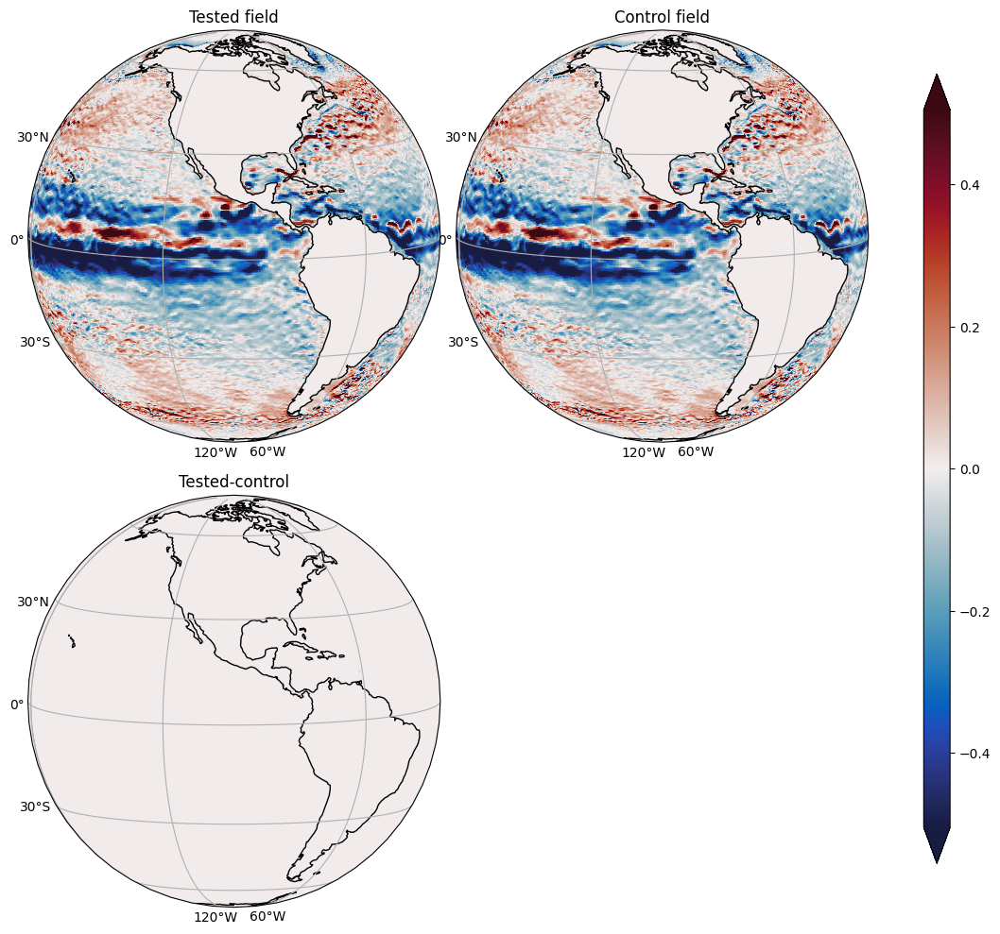

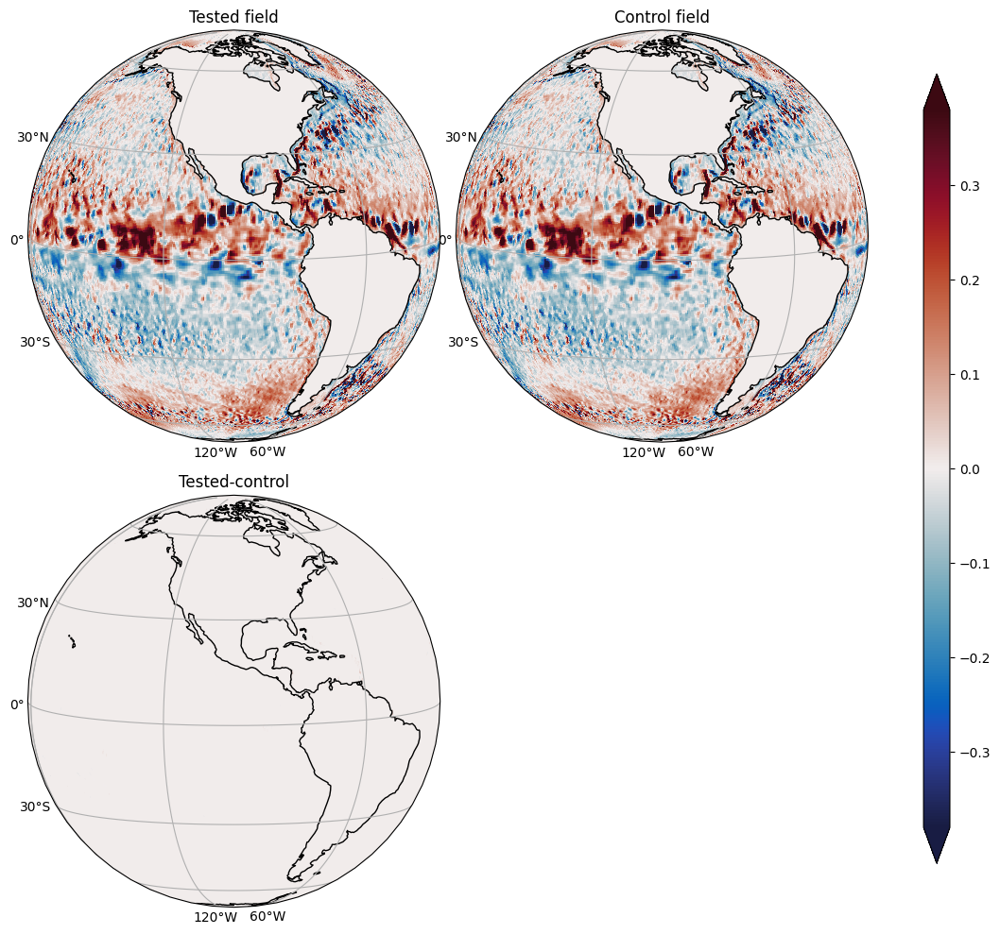

In [6]:
compare(data.u, data_ctrl.u, selector=select_globe)
print('\n')
compare(data.v, data_ctrl.v, selector=select_globe)

Correlation: 0.9987789955644458
Relative Error: 0.012215872526993394
R2 =  0.9975590294554124
R2 max =  0.9975592530965892
Optinal scaling: 1.0004737096310923
Nans [test/control]: [0, 0]


Correlation: 0.9985844727526756
Relative Error: 0.012008566688680137
R2 =  0.9971684147941531
R2 max =  0.9971710662893954
Optinal scaling: 1.0016333127483925
Nans [test/control]: [0, 0]


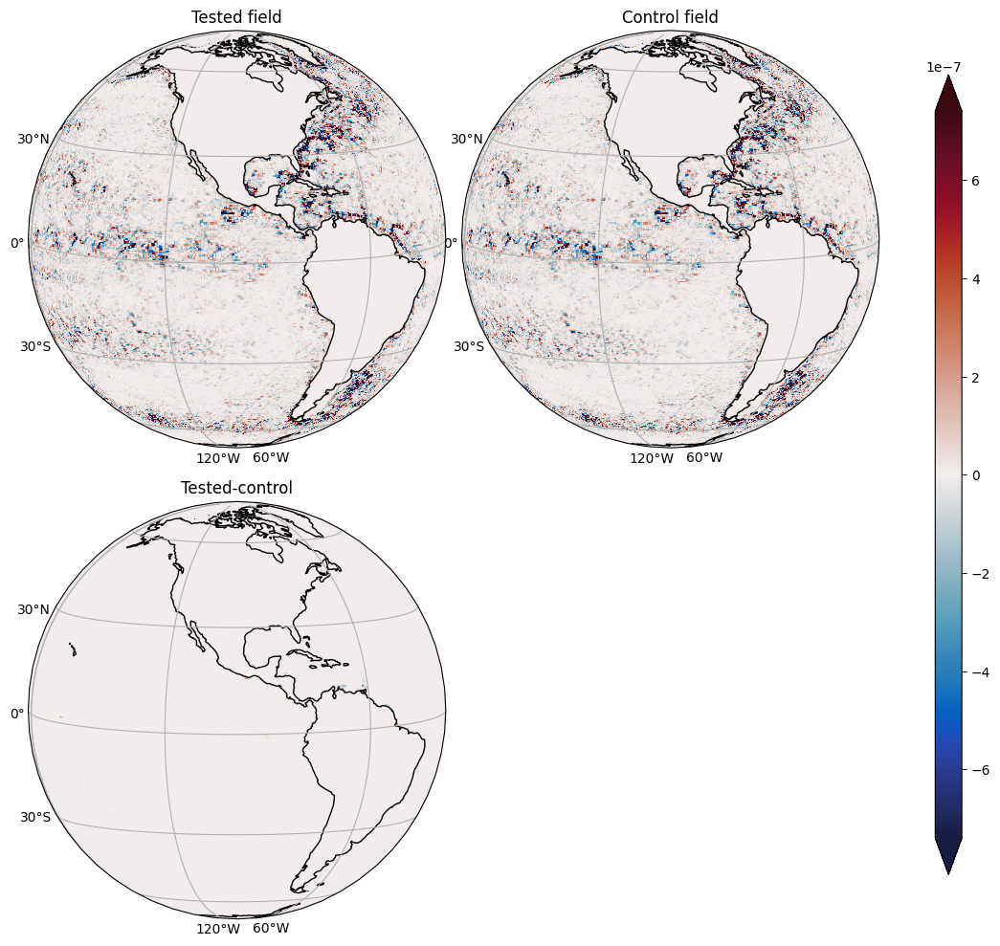

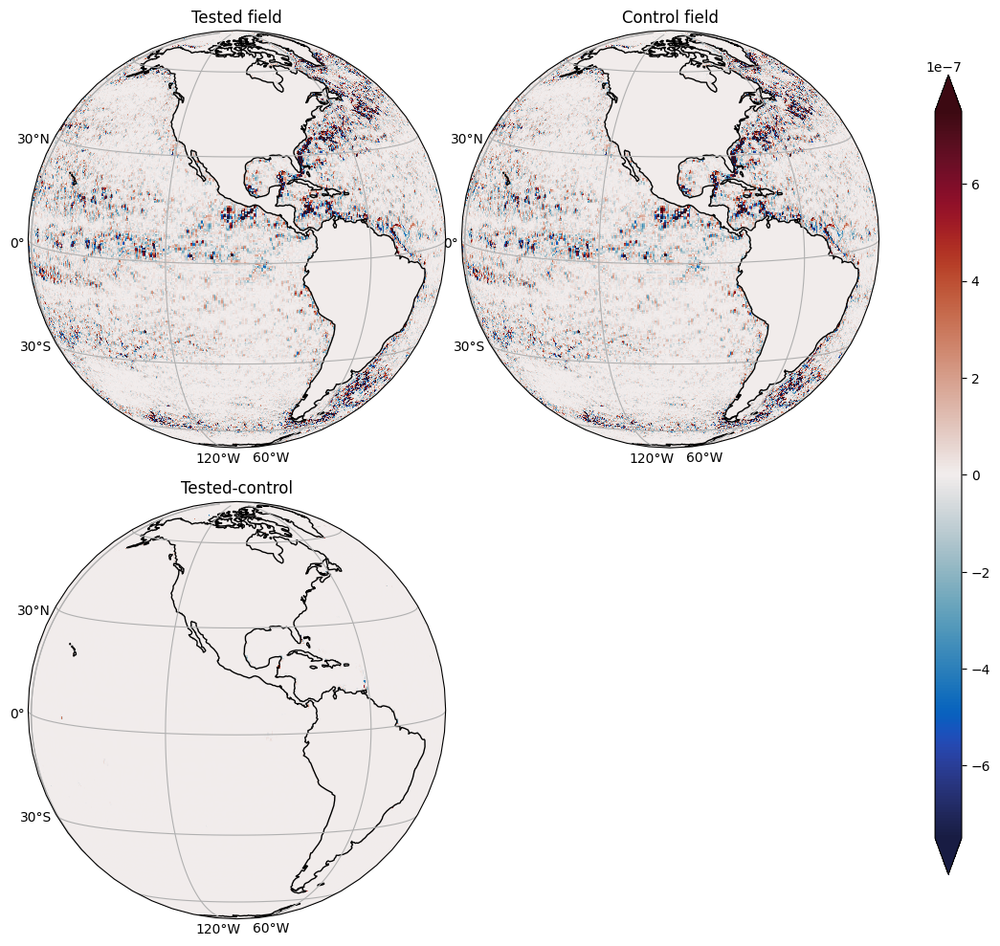

In [7]:
compare(data.SGSx, data_ctrl.SGSx, selector=select_globe)
print('\n')
compare(data.SGSy, data_ctrl.SGSy, selector=select_globe)

# Gaussian filter

In [9]:
SGS = ds.compute_subgrid_forcing(percentile=0, operator=Filtering()+Subsampling(), factor=4)
data_gauss = SGS.data.isel(time=7)

In [10]:
data_ctrl = xr.open_dataset('../leap-test/factor-4-gauss-data.nc')
param_ctrl = xr.open_dataset('../leap-test/factor-4-param.nc')
for key in ['xq', 'yq', 'xh', 'yh']:
    data_ctrl[key] = data[key]
    param_ctrl[key] = data[key]

Correlation: 0.999935107822739
Relative Error: 0.002238238291478767
R2 =  0.9998695311773153
R2 max =  0.9998702688856801
Optinal scaling: 0.9991417819444872
Nans [test/control]: [0, 0]


Correlation: 0.9998742595198722
Relative Error: 0.0031716075973648936
R2 =  0.9997471822471825
R2 max =  0.9997501641253095
Optinal scaling: 0.9982759501815729
Nans [test/control]: [0, 0]


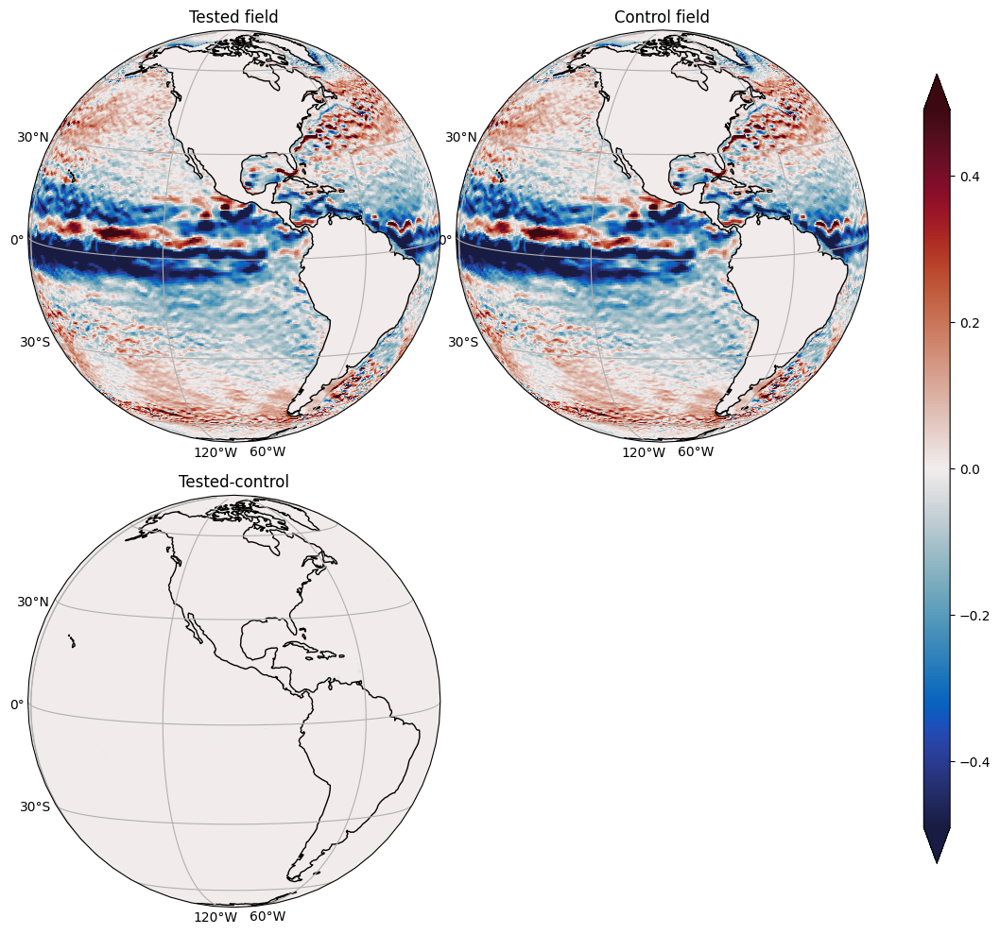

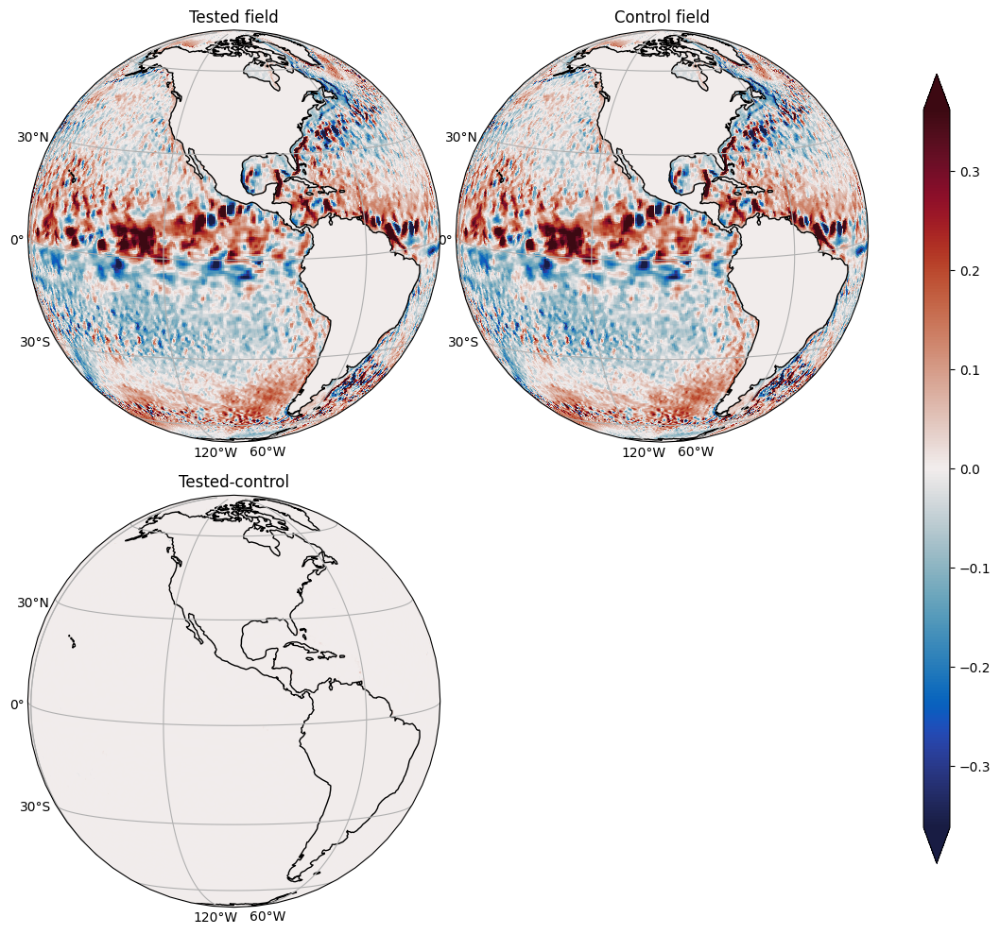

In [14]:
compare(data_gauss.u, data_ctrl.u, selector=select_globe)
print('\n')
compare(data_gauss.v, data_ctrl.v, selector=select_globe)

Correlation: 0.9979593334559339
Relative Error: 0.01638960623479601
R2 =  0.9959137106064557
R2 max =  0.9959224451011361
Optinal scaling: 0.9970472825788225
Nans [test/control]: [0, 0]


Correlation: 0.99782926051566
Relative Error: 0.01671845843738143
R2 =  0.9956524871826848
R2 max =  0.995663549418373
Optinal scaling: 0.9966778445215378
Nans [test/control]: [0, 0]


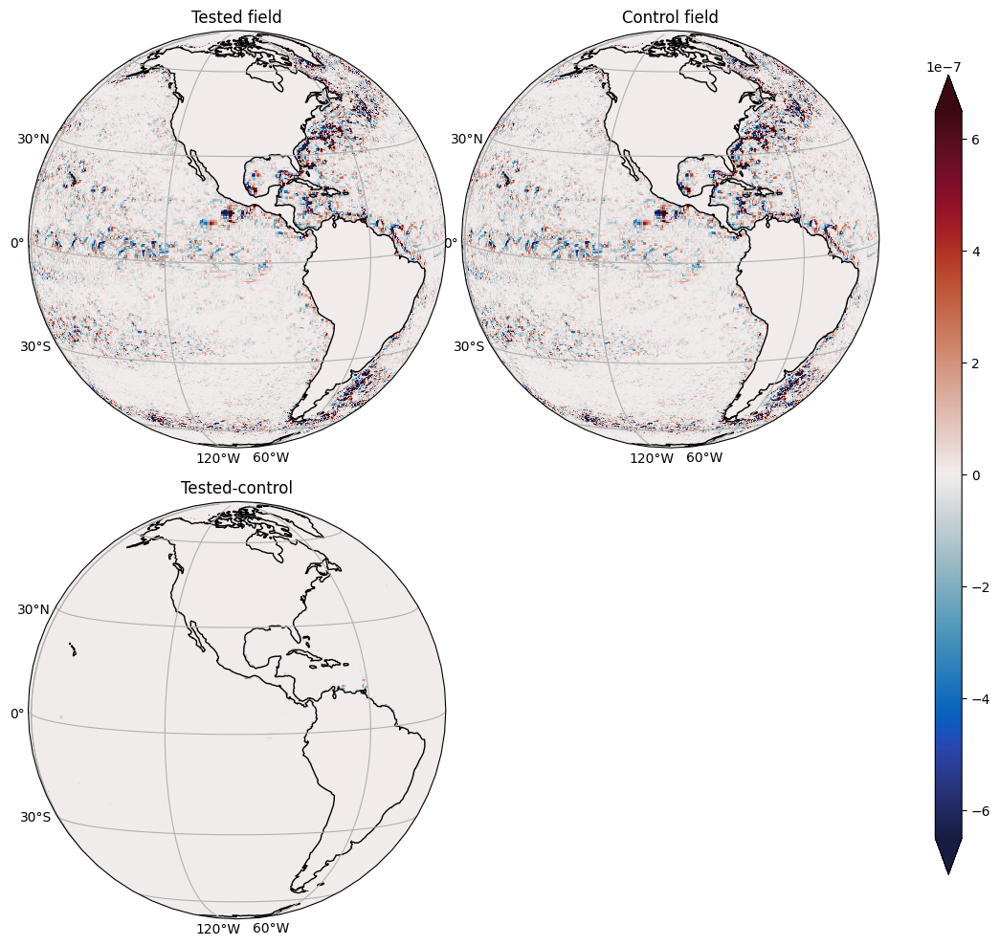

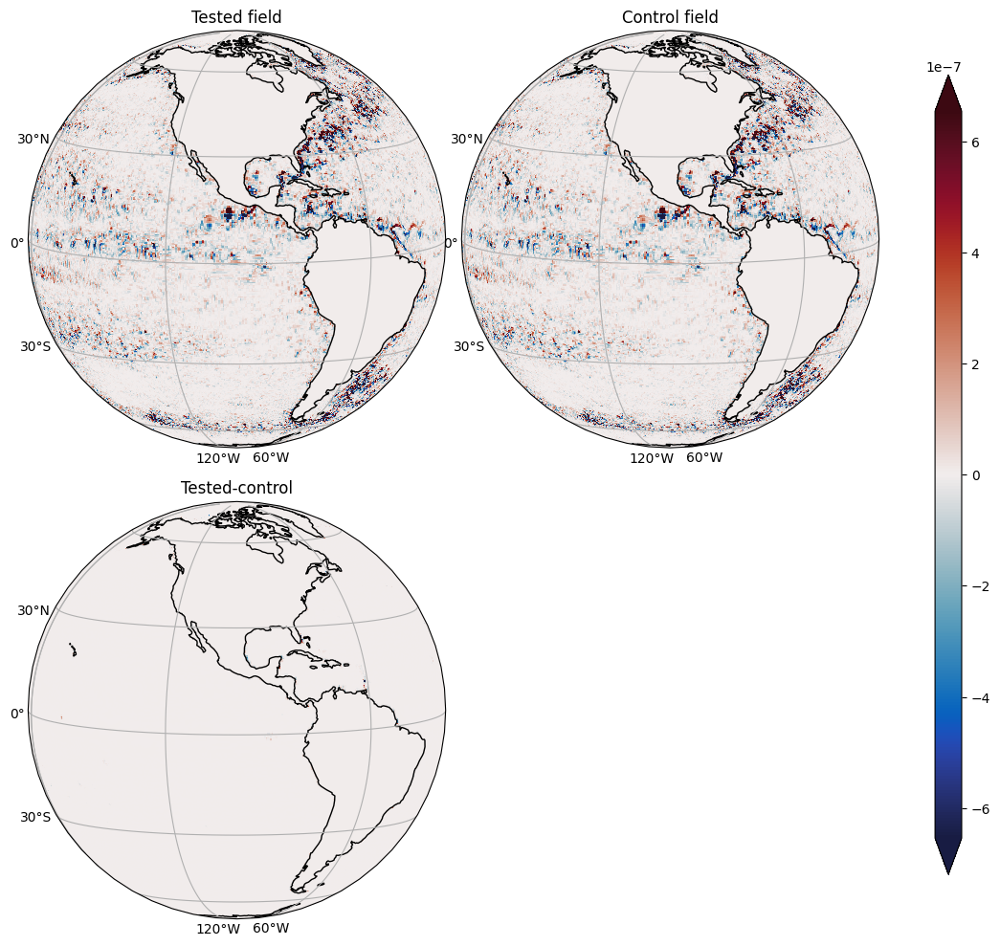

In [13]:
compare(data_gauss.SGSx, data_ctrl.SGSx, selector=select_globe)
print('\n')
compare(data_gauss.SGSy, data_ctrl.SGSy, selector=select_globe)

# 2D versus 3D datasets

In [15]:
surface = DatasetCM26()
ocean = DatasetCM26(source='cmip6-3d')

In [16]:
SGS = surface.compute_subgrid_forcing(factor=4, operator = Filtering()+CoarsenKochkov())

In [17]:
SGS_3d = ocean.compute_subgrid_forcing(factor=4, operator = Filtering()+CoarsenKochkov())

In [25]:
oce = SGS_3d.split(zl=0).data
surf = SGS.data.sel(time=oce.time)

Correlation: 0.9713729398450603
Relative Error: 0.25469005841518844
R2 =  0.9435553004456073
R2 max =  0.9435696003297757
Optinal scaling: 1.0039081684780429
Nans [test/control]: [0, 0]


Correlation: 0.9468132348571067
Relative Error: 0.33096639433862857
R2 =  0.8960308781114363
R2 max =  0.8965049192992746
Optinal scaling: 1.023536120220575
Nans [test/control]: [0, 0]


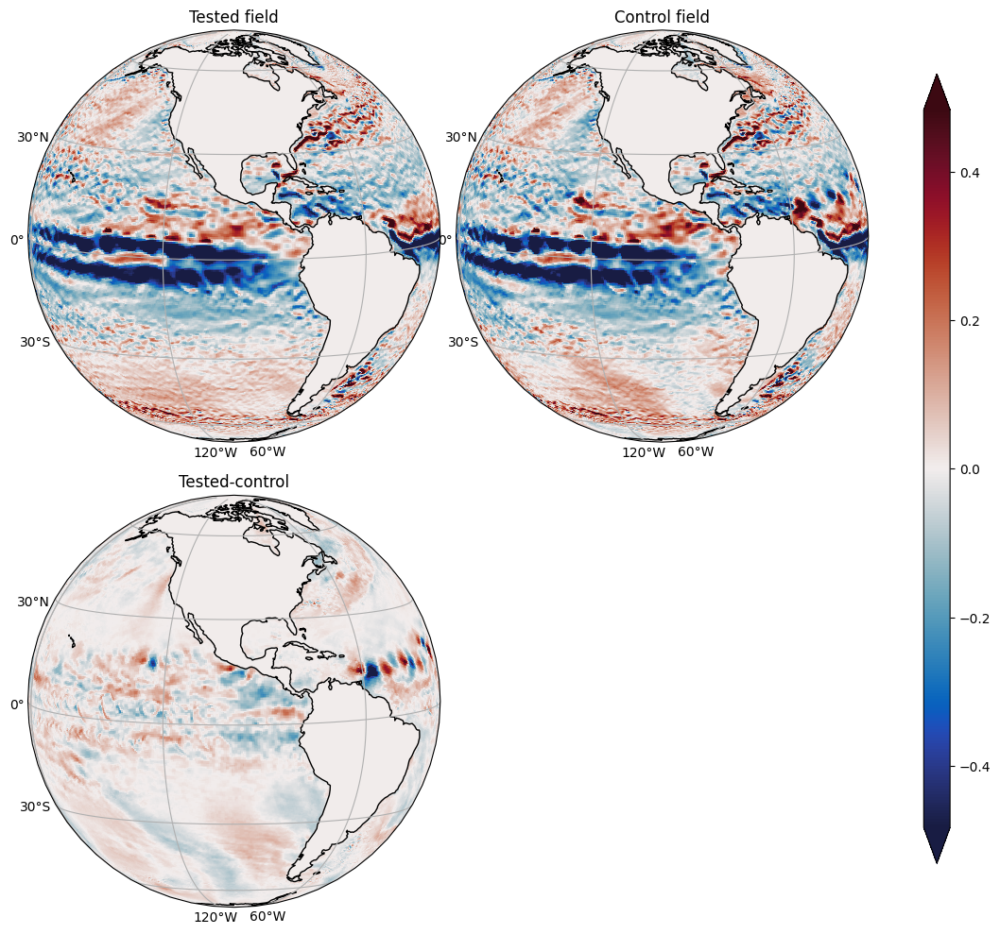

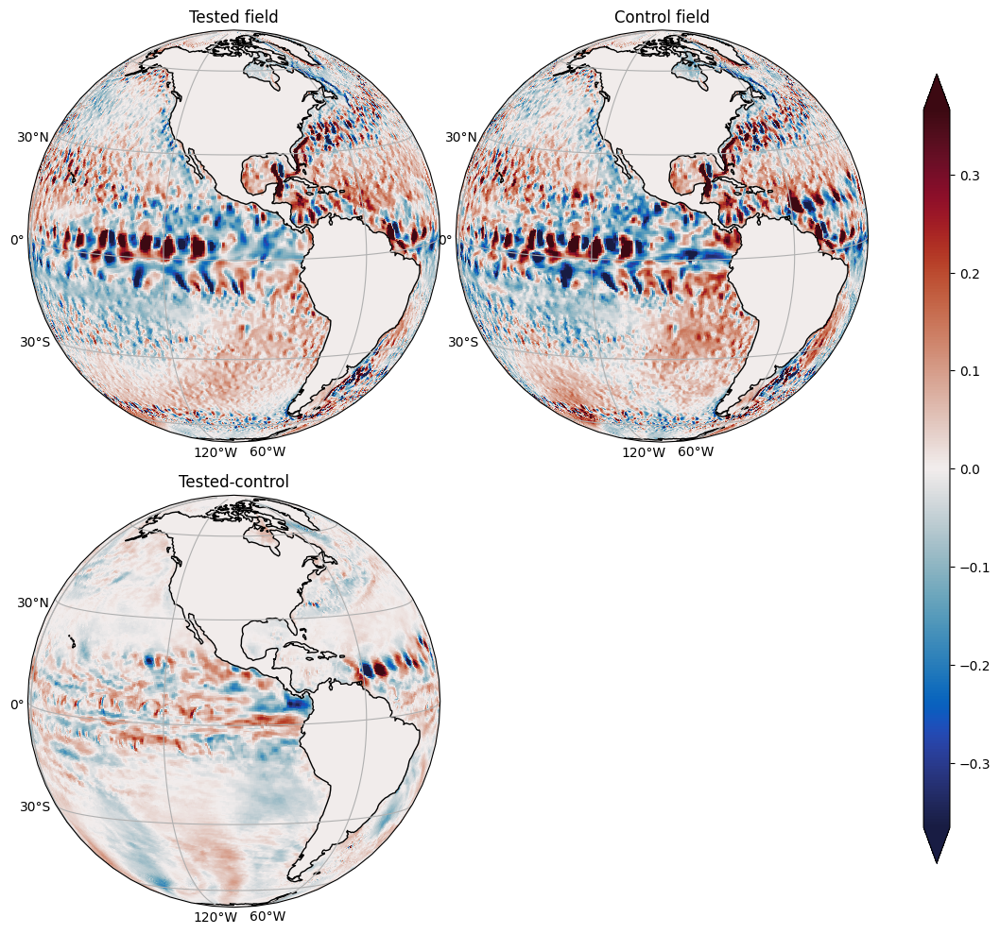

In [27]:
compare(oce.u, surf.u, selector=select_globe)
print('\n')
compare(oce.v, surf.v, selector=select_globe)

Correlation: 0.9133177231269449
Relative Error: 0.3669466776463874
R2 =  0.8277157255215819
R2 max =  0.8341369042885766
Optinal scaling: 1.0961765561875323
Nans [test/control]: [0, 0]


Correlation: 0.9190898747322565
Relative Error: 0.3606318056839027
R2 =  0.8391394691496897
R2 max =  0.8447245307502647
Optinal scaling: 1.0885092264682696
Nans [test/control]: [0, 0]


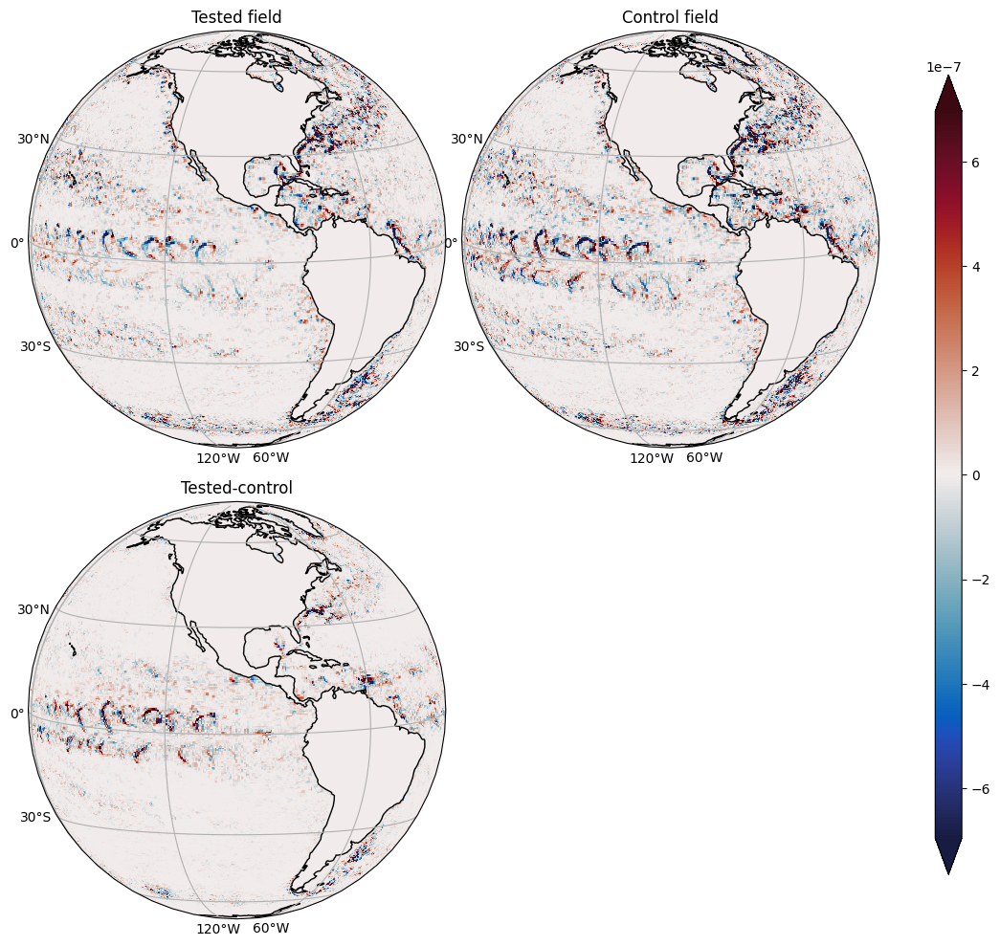

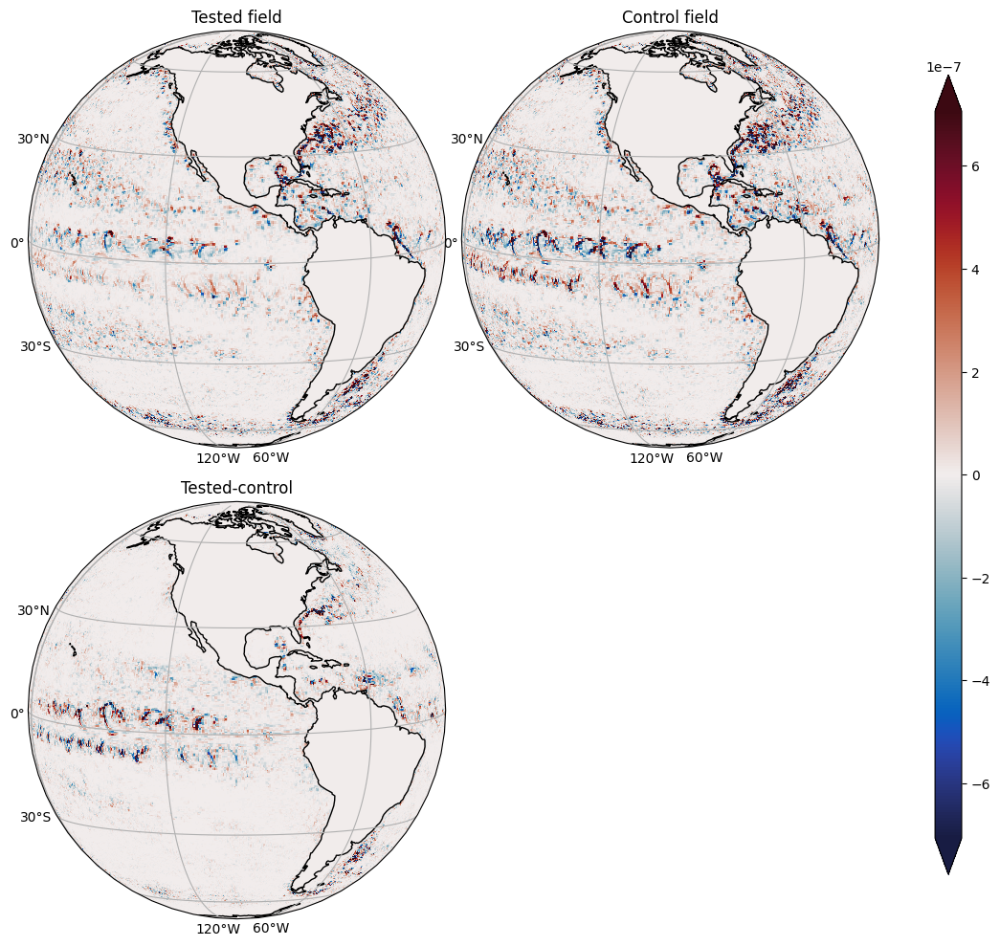

In [28]:
compare(oce.SGSx, surf.SGSx, selector=select_globe)
print('\n')
compare(oce.SGSy, surf.SGSy, selector=select_globe)

In [30]:
%time SGS_3d.data.SGSx.isel(zl=1,time=-1).compute();
%time SGS_3d.data.SGSx.isel(zl=slice(0,14),time=-1).compute();
%time SGS_3d.data.SGSx.isel(zl=0,time=slice(0,14)).compute();

CPU times: user 18.8 s, sys: 13 s, total: 31.8 s
Wall time: 14.5 s
CPU times: user 4min 12s, sys: 4min 59s, total: 9min 12s
Wall time: 1min 8s
CPU times: user 4min 11s, sys: 1min 46s, total: 5min 58s
Wall time: 39.5 s


# Subfilter versus subgrid

In [2]:
surface = DatasetCM26()

# FGR=4

In [5]:
%time SGS = surface.compute_subgrid_forcing(operator=Filtering(FGR=4)+CoarsenKochkov(), factor=4)

CPU times: user 9.4 s, sys: 2.17 s, total: 11.6 s
Wall time: 9.24 s


In [6]:
SFS = surface.compute_subfilter_forcing(operator_filter=Filtering(FGR=4), operator_coarsen=CoarsenKochkov(), factor=4)

Correlation: 0.9999999999999998
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]
Correlation: 1.0
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]


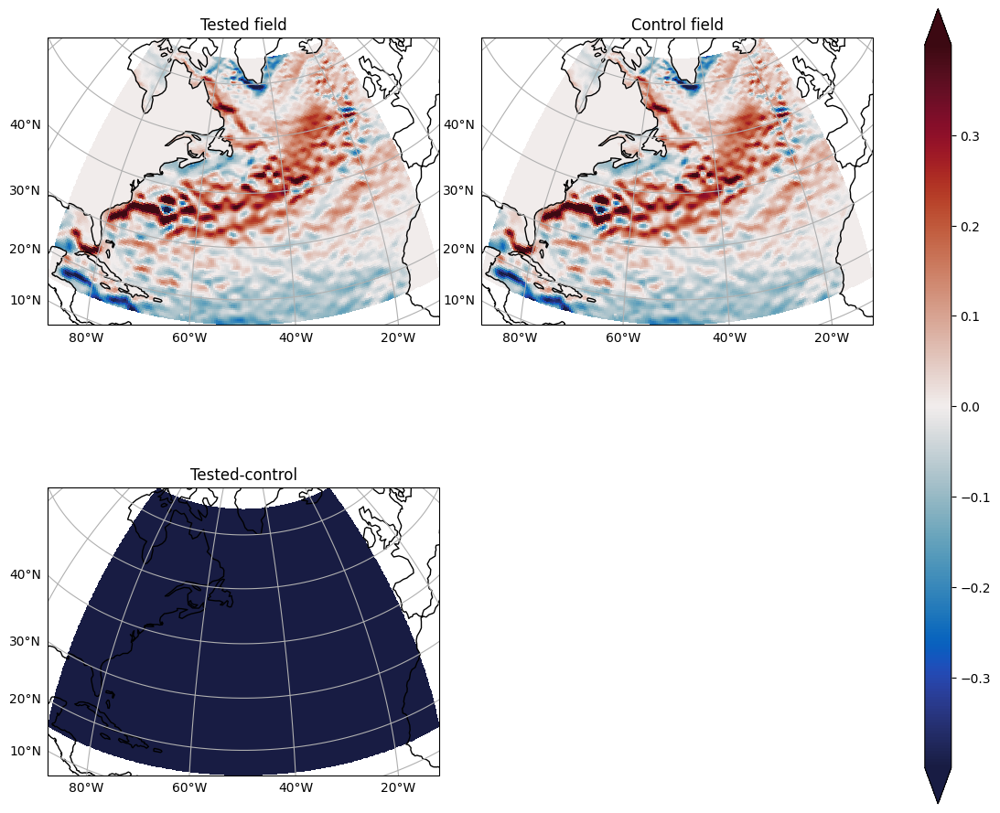

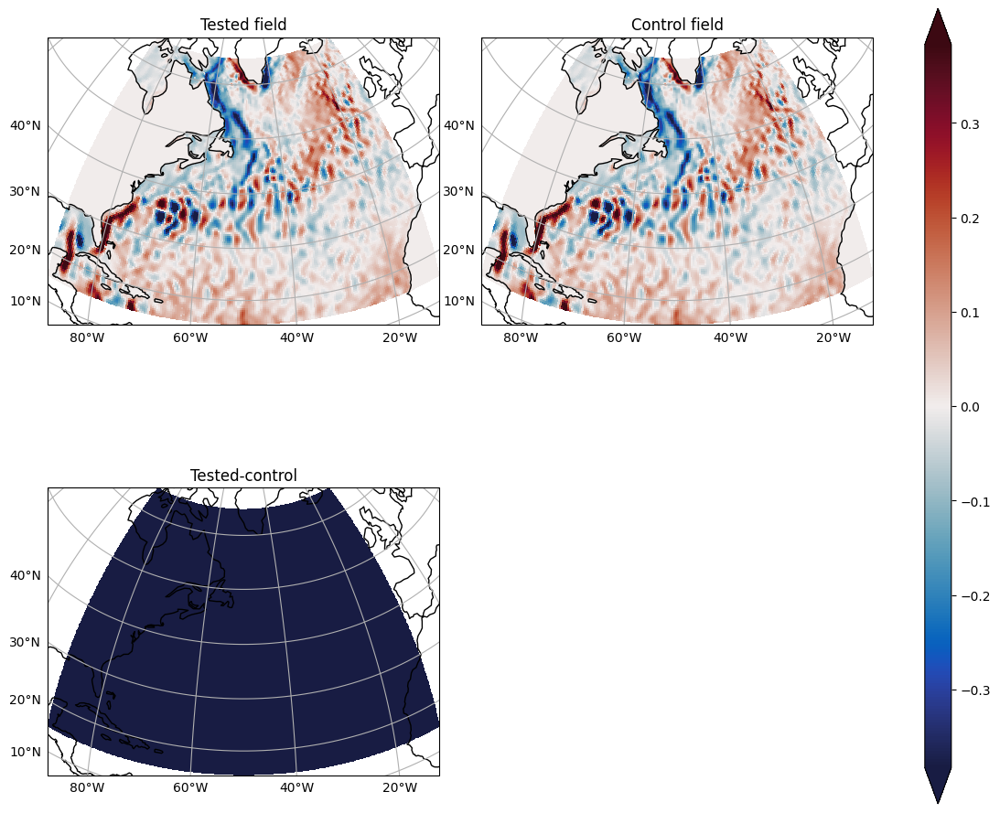

In [7]:
compare(SFS.data.u,SGS.data.u)
compare(SFS.data.v,SGS.data.v)

Correlation: 0.9717103454941088
Relative Error: 0.18474703195006903
R2 =  0.9441988680926279
R2 max =  0.9442080009457958
Optinal scaling: 1.0031197672030767
Nans [test/control]: [0, 0]
Correlation: 0.8982054428855645
Relative Error: 0.23682955144665557
R2 =  0.7890067771537086
R2 max =  0.8069888721971754
Optinal scaling: 0.8701139517574866
Nans [test/control]: [0, 0]


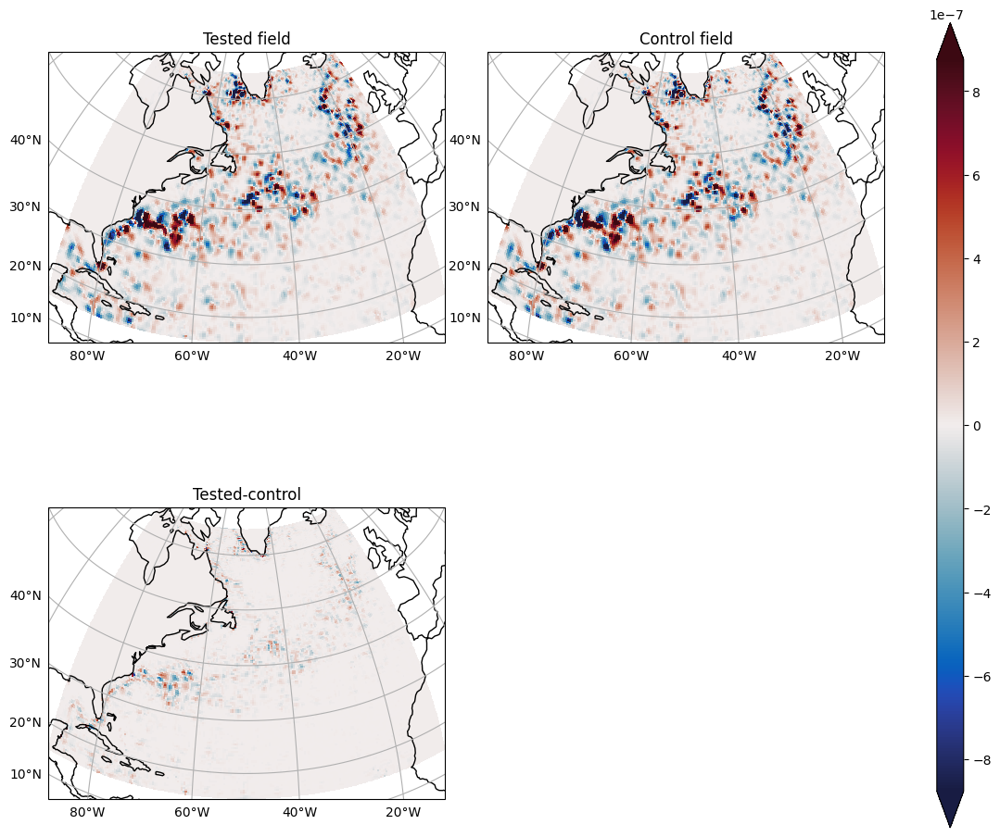

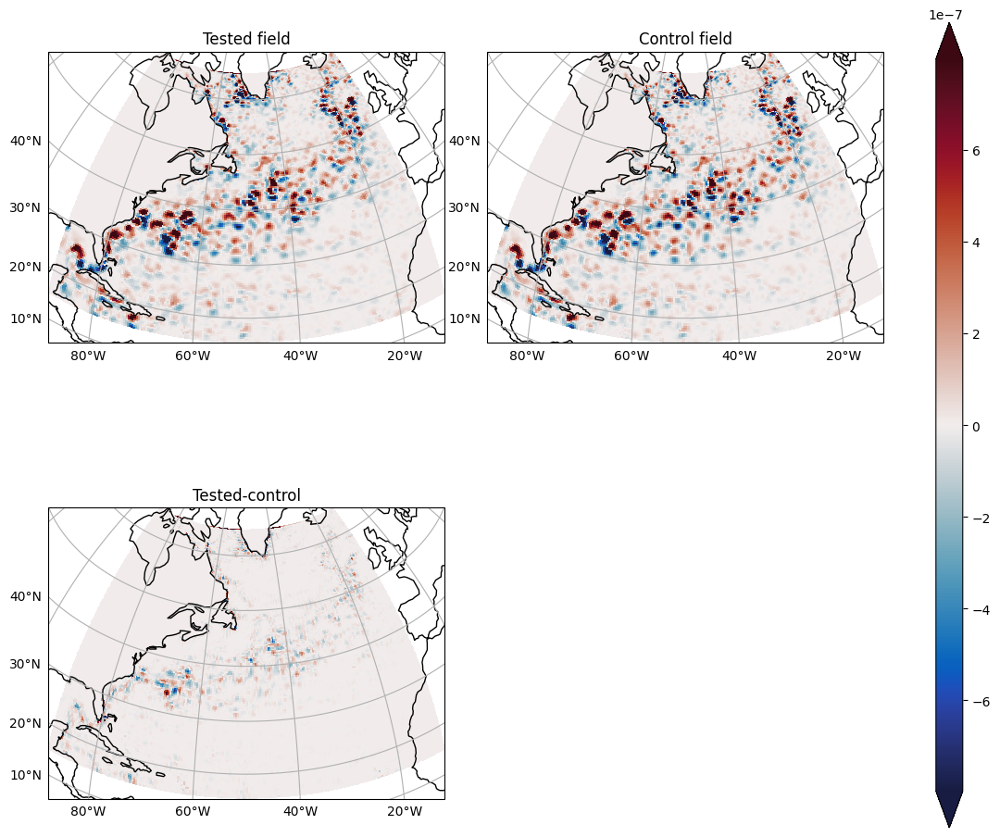

In [8]:
compare(SFS.data.SGSx,SGS.data.SGSx)
compare(SFS.data.SGSy,SGS.data.SGSy)

# FRG=1

In [3]:
%time SGS = surface.compute_subgrid_forcing(operator=Filtering(FGR=1)+CoarsenKochkov(), factor=4)
%time SFS = surface.compute_subfilter_forcing(operator_filter=Filtering(FGR=1), operator_coarsen=CoarsenKochkov(), factor=4)

CPU times: user 9.18 s, sys: 521 ms, total: 9.7 s
Wall time: 8.93 s
CPU times: user 8.89 s, sys: 377 ms, total: 9.27 s
Wall time: 8.37 s


Correlation: 1.0000000000000002
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]
Correlation: 0.9999999999999999
Relative Error: 0.0
R2 =  1.0
R2 max =  1.0
Optinal scaling: 1.0
Nans [test/control]: [0, 0]


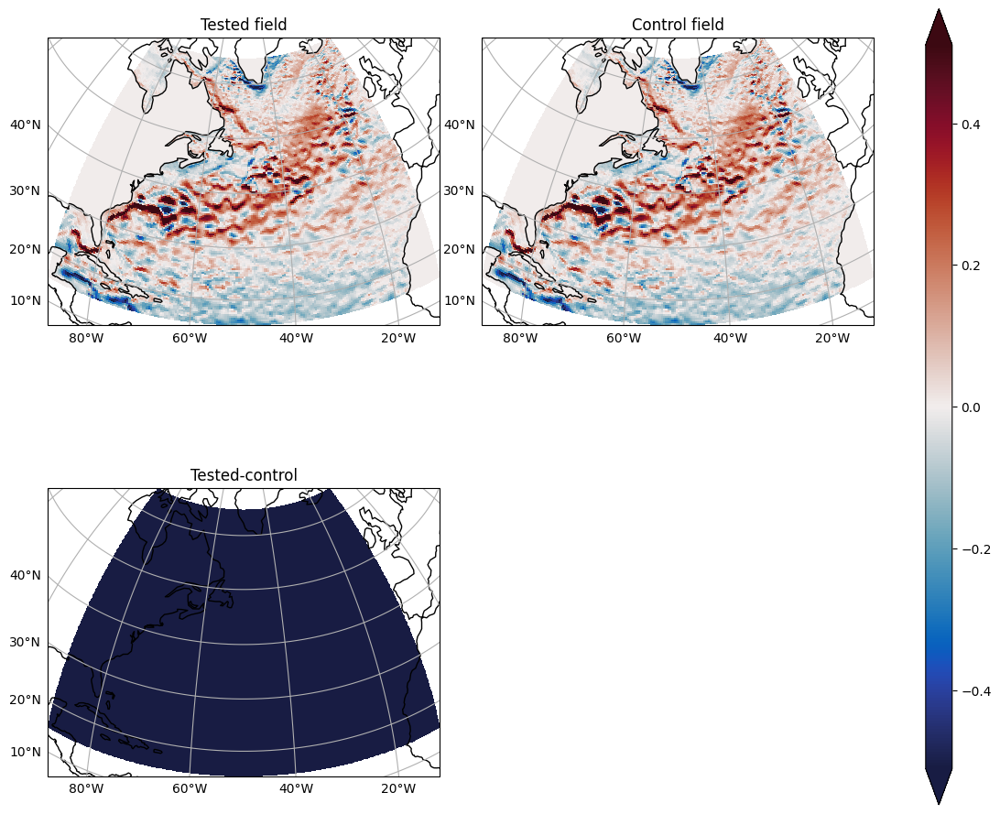

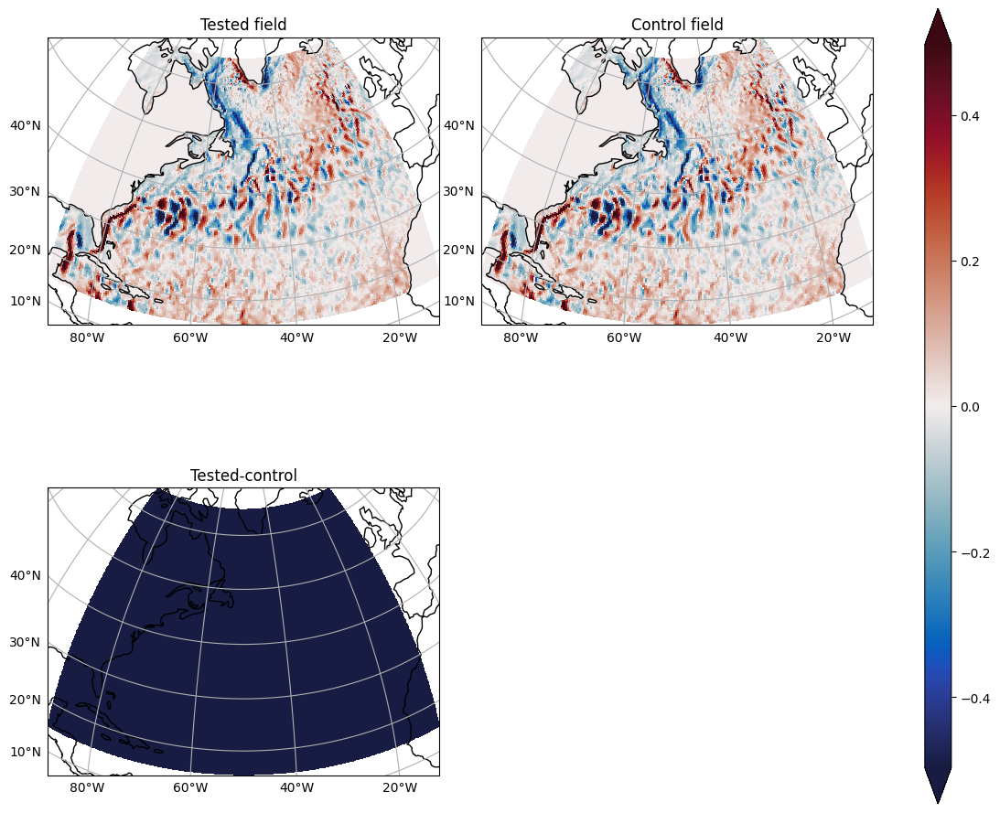

In [4]:
compare(SFS.data.u,SGS.data.u)
compare(SFS.data.v,SGS.data.v)

Correlation: 0.5889196044000781
Relative Error: 0.8749578180036253
R2 =  0.24544058787172296
R2 max =  0.3468286362393087
Optinal scaling: 2.1771054620892647
Nans [test/control]: [0, 0]
Correlation: 0.5258988138907983
Relative Error: 0.8941368003023755
R2 =  0.23189317855148261
R2 max =  0.2765557106249976
Optinal scaling: 1.6718638196040077
Nans [test/control]: [0, 0]


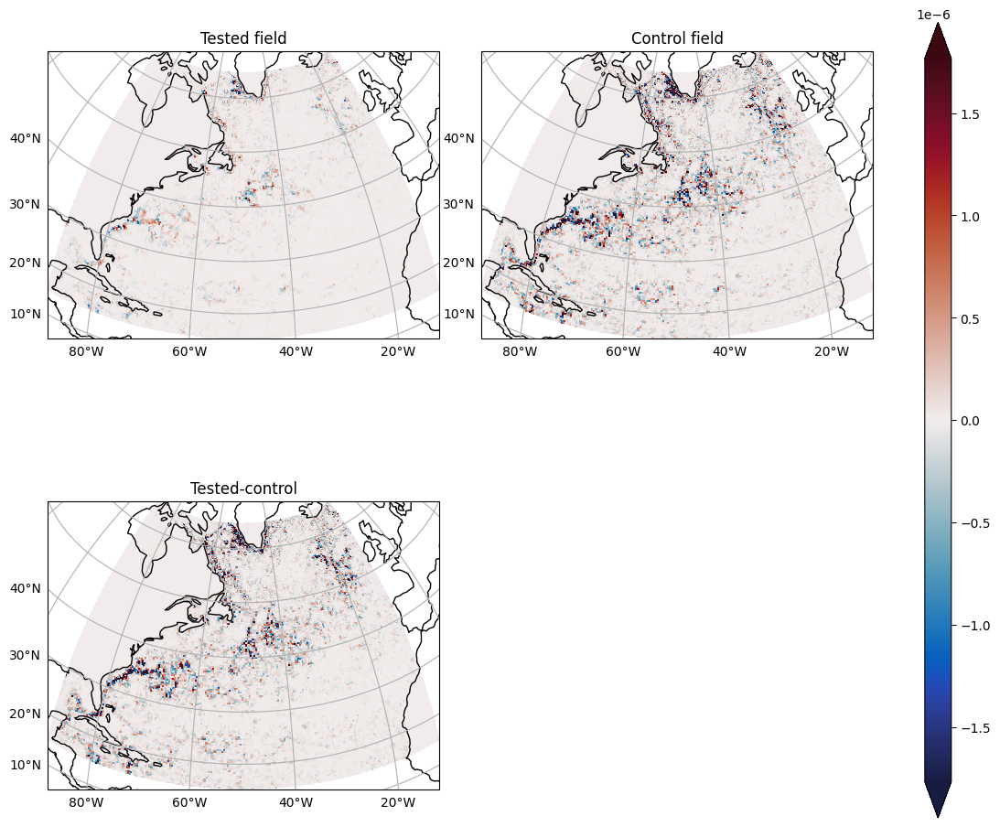

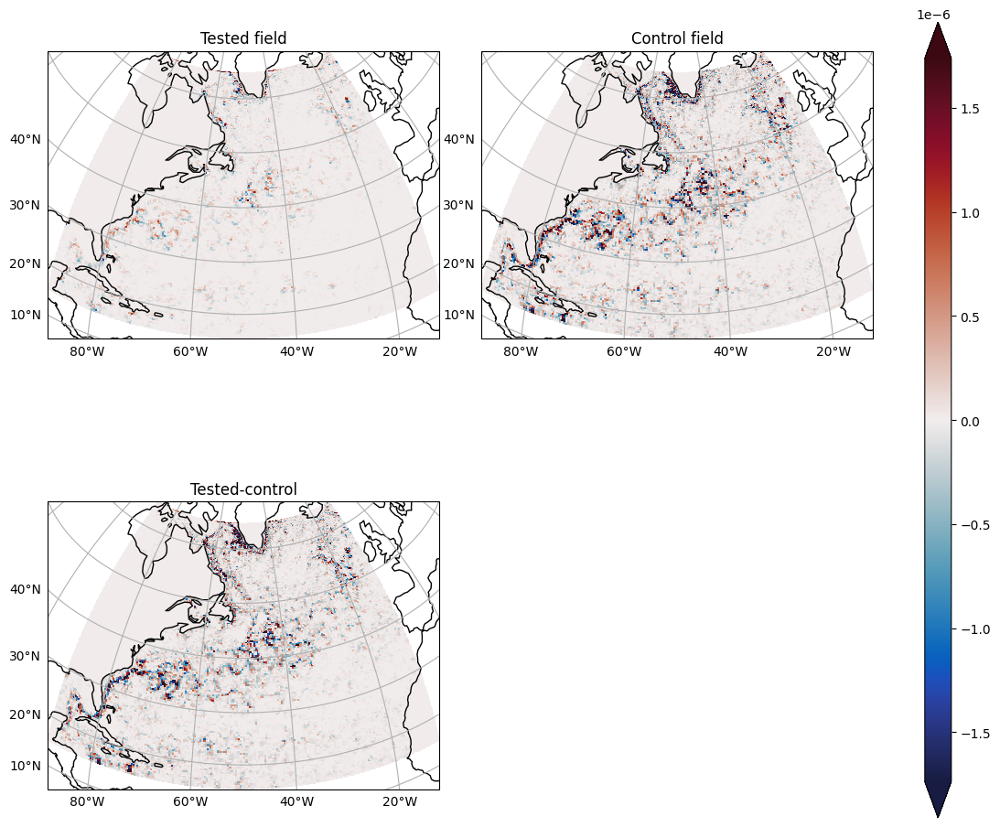

In [5]:
compare(SFS.data.SGSx,SGS.data.SGSx)
compare(SFS.data.SGSy,SGS.data.SGSy)

# FGR = 2

In [6]:
%time SGS = surface.compute_subgrid_forcing(operator=Filtering(FGR=2)+CoarsenKochkov(), factor=4)
%time SFS = surface.compute_subfilter_forcing(operator_filter=Filtering(FGR=2), operator_coarsen=CoarsenKochkov(), factor=4)

CPU times: user 9.2 s, sys: 940 ms, total: 10.1 s
Wall time: 8.65 s
CPU times: user 9.26 s, sys: 823 ms, total: 10.1 s
Wall time: 8.57 s


Correlation: 0.8173247916328908
Relative Error: 0.6207744608895113
R2 =  0.6391050361865774
R2 max =  0.668016588598932
Optinal scaling: 1.2626863972344506
Nans [test/control]: [0, 0]
Correlation: 0.6802056024810286
Relative Error: 0.6800470006429484
R2 =  0.46020765852506385
R2 max =  0.46277353889819617
Optinal scaling: 0.9306984521231054
Nans [test/control]: [0, 0]


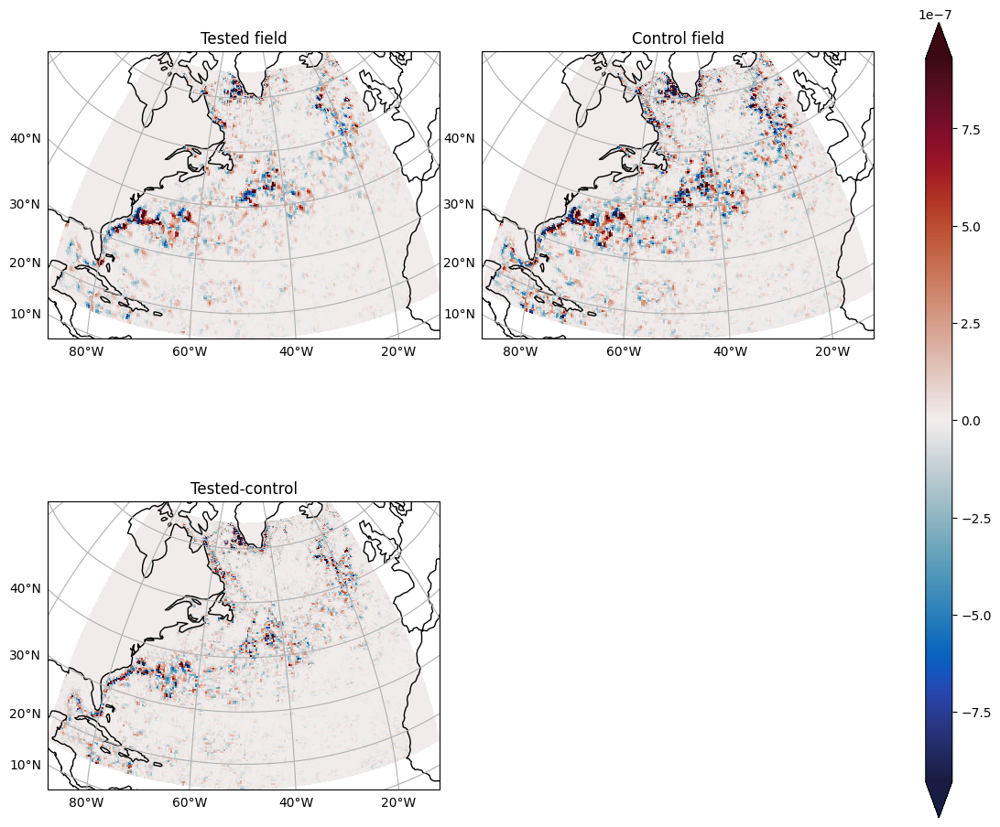

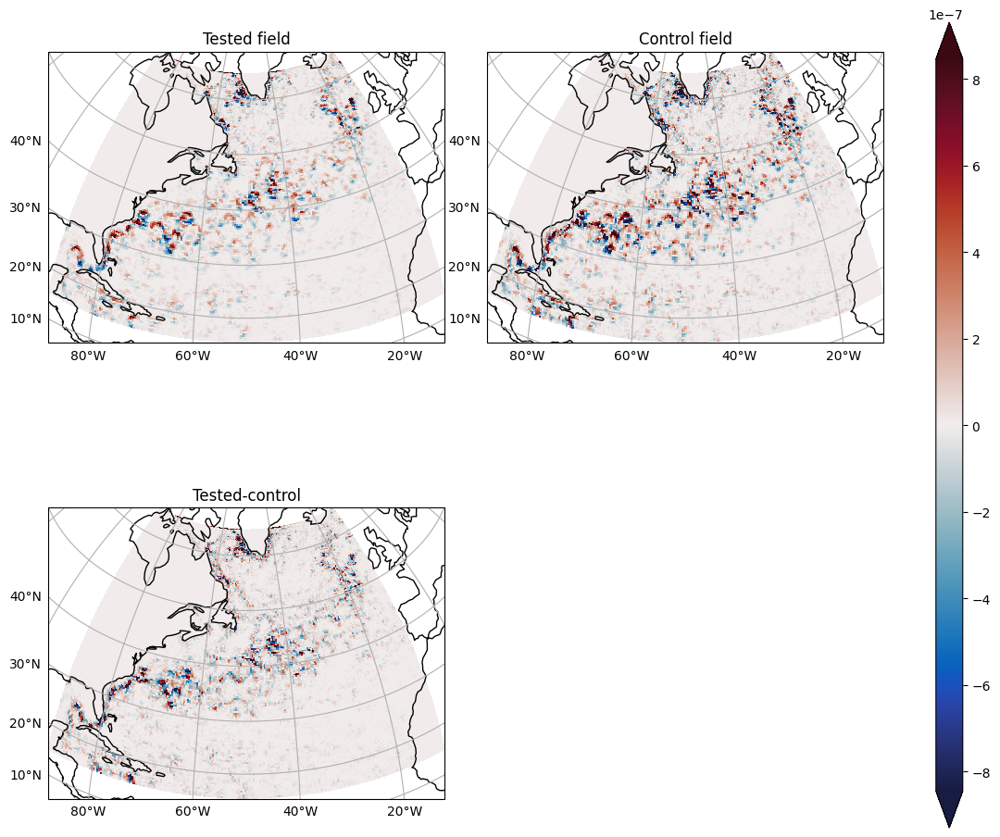

In [7]:
compare(SFS.data.SGSx,SGS.data.SGSx)
compare(SFS.data.SGSy,SGS.data.SGSy)